In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import LinearGrid, ConcentricGrid
from desc.objectives import (
    ObjectiveFunction,
    FixBoundaryR,
    FixBoundaryZ,
    FixPressure,
    FixCurrent,
    FixIota,
    FixPsi,
    AspectRatio,
    ForceBalance,
    QuasisymmetryTwoTerm,
    RotationalTransform
)
from desc.optimize import Optimizer
from desc.plotting import (
    plot_grid,
    plot_boozer_modes,
    plot_boozer_surface,
    plot_qs_error,
    plot_boundaries,
    plot_boundary,
    plot_3d
)

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.profiles import PowerSeriesProfile

An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


DESC version 0+untagged.9470.gaf75d5a.dirty,using JAX backend, jax version=0.4.28, jaxlib version=0.4.28, dtype=float64
Using device: CPU, with 6.44 GB available memory


In [2]:
eq_fam = desc.io.load("inputs/nfp2_QA.h5")
eq_init = eq_fam[-1]
eq_qs = eq_init.copy()

In [3]:
optimizer = Optimizer("lsq-exact")

grid_vol = LinearGrid(
    M=eq_qs.M_grid,
    N=eq_qs.N_grid,
    NFP=eq_qs.NFP,
    rho=np.arange(0.1,1.1,0.1),
    sym=eq_qs.sym
)

In [4]:
for maxMode in range(1,2):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    
    objective_f = ObjectiveFunction((
        AspectRatio(eq=eq_qs, target=6, weight=1),
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        ForceBalance(eq=eq_qs, weight=10),
    ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=20,
        options={}
    )


Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 790 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 939 ms
Timer: Objective build = 4.30 sec
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 1.87 sec
Timer: Linear constraint projection build = 3.41 sec
Number of parameters: 155
Number of objectives: 1051
Starting optimization
Using method: lsq-exact
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          5.000e-01                                    1.003e+01   
       1              2          4.875e-01      1.254e-02  

In [5]:
print(result.x.shape, result.allx[-1].shape)
print(objective_f.compute_scalar(result.allx[-1]))
# print(result.allx[-1])
x_temp = np.array(result.allx[-1])
# print(x_temp)
x_temp[np.abs(x_temp) < 1e-8] = 0.0
print(x_temp[np.abs(x_temp) > 1e-6])
print(objective_f.compute_scalar(x_temp))

(155,) (363,)
5.39360375034122e-10
[ 9.97229044e-01  1.62945736e-01  2.75053058e-03  1.33794983e-04
  2.04253447e-05 -1.70541109e-01 -4.74498002e-05  2.08420607e-04
  4.74498002e-05 -9.62914894e-02  7.00392374e-03 -1.23141674e-05
 -5.32241203e-04 -9.34909176e-06  8.30000000e-02  9.94498939e-01
  1.00000000e+00  1.63079531e-01 -1.70332688e-01]
5.393902132308674e-10


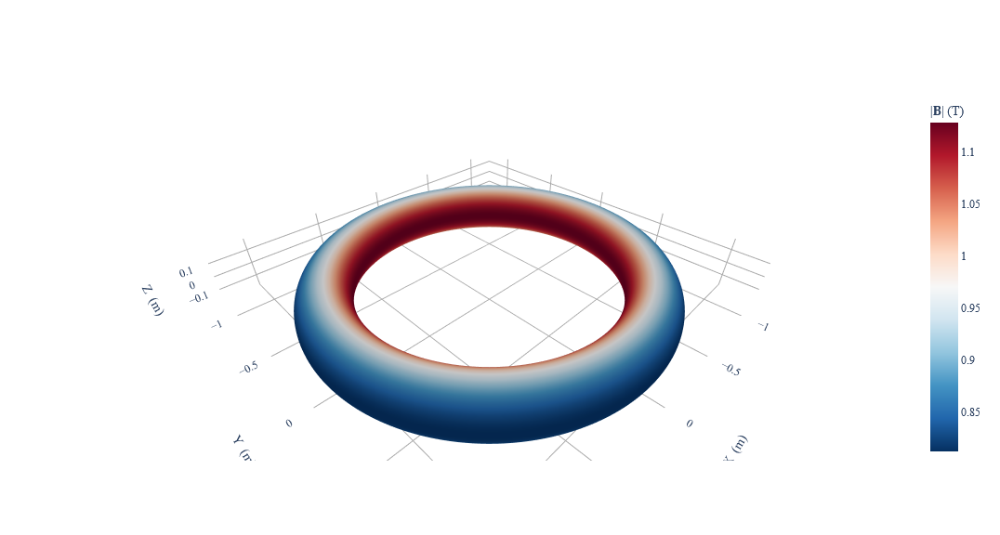

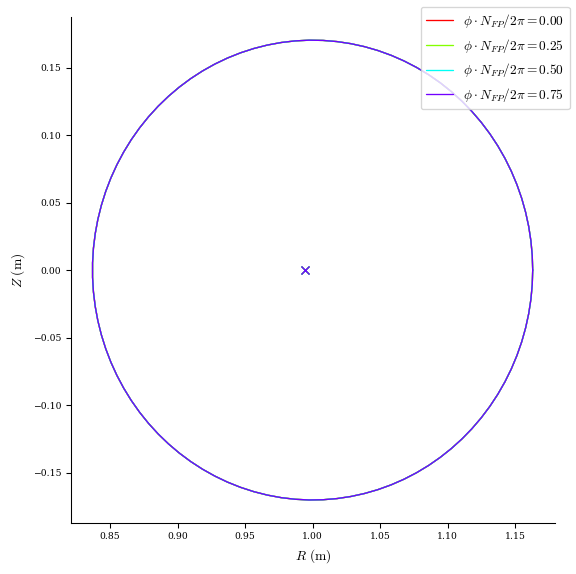

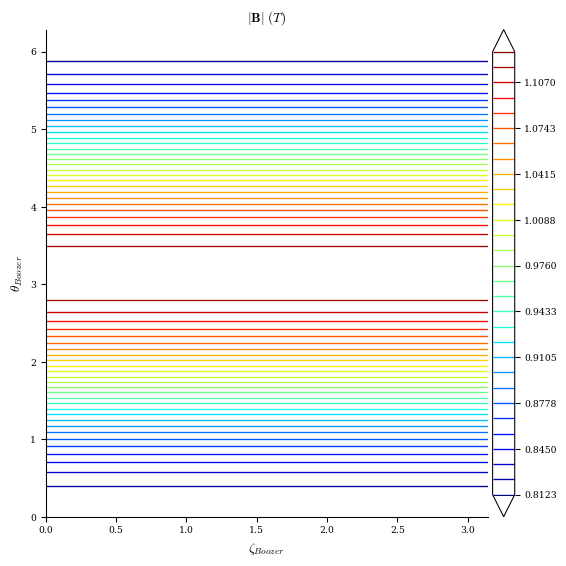

In [6]:
plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))

In [7]:
eq_qs = eq_init.copy()
objective_f = ObjectiveFunction((
    AspectRatio(eq=eq_qs, target=6, weight=1),
    #FixPressure(eq=eq_qs, weight=constWeight),
    #FixCurrent(eq=eq_qs, weight=constWeight),
    #FixPsi(eq=eq_qs, weight=constWeight),
    ForceBalance(eq=eq_qs, weight=10),
))
optimizer = Optimizer("Turbo1")

for maxMode in range(2,3):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    global_eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=5000,
        options={"trust_regions":1, "box_size":0.2, "training_steps": 40, "batch_size":200}
    )

Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 49.6 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 74.5 ms
Timer: Objective build = 331 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 1.05 sec
Timer: Linear constraint projection build = 1.96 sec
Number of parameters: 171
Number of objectives: 1051
Starting optimization
Using method: Turbo1
ub - lb 0.33942164500809546 2.0022161128174577e-12 0.013573323678882362
lb [ 7.93446170e-07  1.68824232e-07 -1.98721412e-09 -8.68563582e-08
 -7.23380854e-07  1.19710548e-07 -4.26527645e-10 -7.25094311e-07
 -8.70037278e-08 -6.49544916e-10  3.716

In [8]:
print(objective_f.compute_scalar(result.allx[np.argmin(result.allfun)]))
print(np.shape(result.x), np.shape(result.allx[-1]), np.shape(result.allx))
print(result.allx[0][np.abs(result.allx[0]) > 1e-6])
print(result.allx[-1][np.abs(result.allx[-1]) > 1e-6])

2714564.199997253
(171,) (363,) (5342, 363)
[-1.31764695e-02  1.25715771e-02  1.31764695e-02 -1.25715771e-02
  5.65066532e-03 -1.22280107e-02 -5.65066532e-03  1.22280107e-02
 -2.03920451e-02  7.12367857e-03  2.03920451e-02 -7.12367857e-03
  5.06383743e-03 -2.08974415e-03 -2.53191409e-03  1.04487290e-03
  2.47945526e-03  1.11015230e-06 -1.23972827e-03 -2.22017896e-06
  1.01741695e+00  2.03329141e-01 -4.73962920e-02  4.38219718e-03
 -9.26644403e-03  2.99793410e-02 -8.76761900e-03 -1.74935167e-06
  2.09072501e-03  1.13617197e-06  7.78721773e-03 -4.33734977e-03
  3.40639255e-05  4.03430068e-02  1.06552703e-06 -4.93140735e-03
 -4.03430068e-02  4.93140735e-03 -3.90689719e-03  3.80086386e-03
  3.14503327e-06  1.06033329e-04 -3.14503327e-06 -2.20929958e-02
 -5.25317758e-03  2.68131695e-04  1.97190049e-06  5.25317758e-03
  2.18248641e-02 -1.97190049e-06 -4.43497065e-03  4.43497065e-03
 -9.88951240e-04 -2.31606491e-03 -3.61894152e-04  3.30501615e-03
  3.61894152e-04  1.63254515e-03 -5.44498457e-

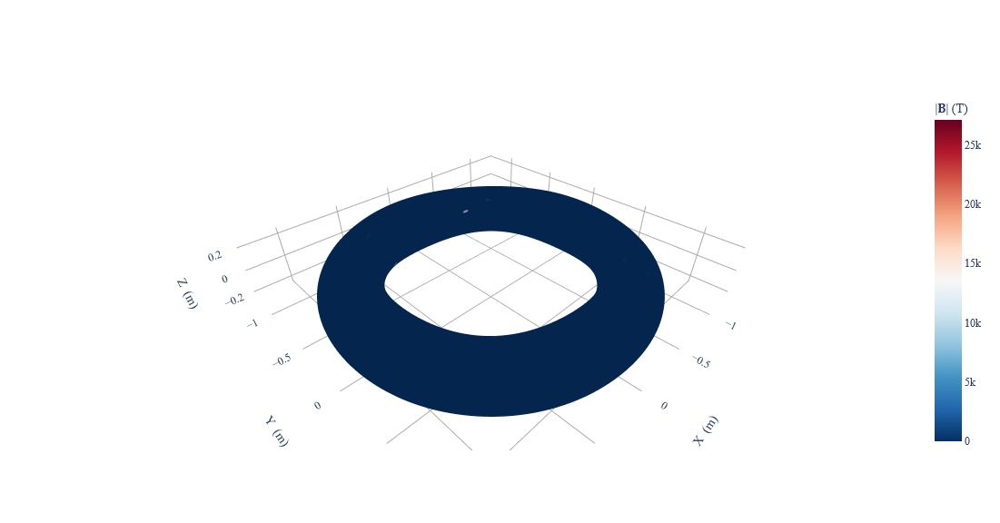

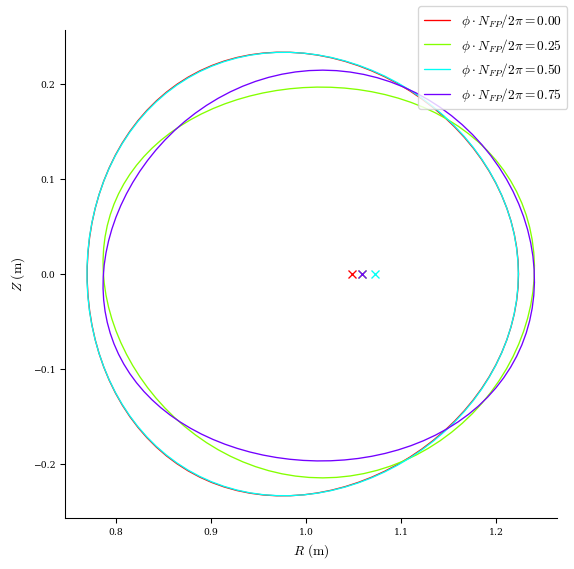

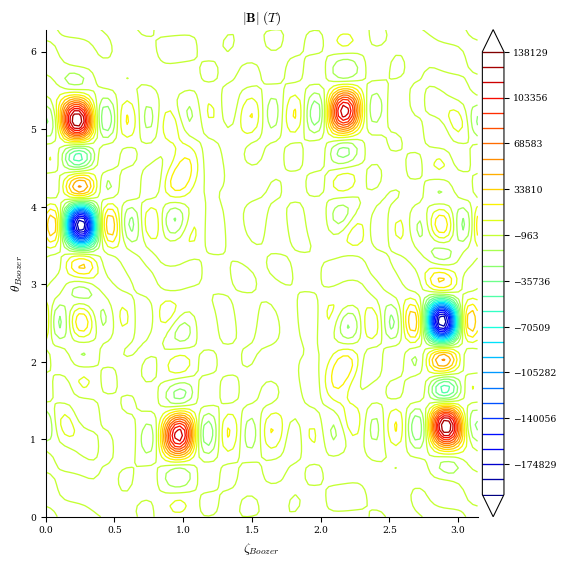

In [9]:
plot_boundary(global_eq_qs, figsize=(6,6))
plot_boozer_surface(global_eq_qs, figsize=(6,6))
plot_3d(global_eq_qs, "|B|", figsize=(6,6))

In [10]:
objective_f.print_value(result.allx[np.argmin(result.allfun)])

Total (sum of squares):  2.715e+06, 
Aspect ratio:  4.204e+00 (dimensionless)
Maximum absolute Force error:  2.406e+08 (N)
Minimum absolute Force error:  9.259e-01 (N)
Average absolute Force error:  9.645e+05 (N)
Maximum absolute Force error:  1.756e+02 (normalized)
Minimum absolute Force error:  6.756e-07 (normalized)
Average absolute Force error:  7.038e-01 (normalized)
